# NWA suntans: sea surface temperature



In [1]:
import os

import numpy as np
import pandas as pd
import xarray as xr

%matplotlib inline
from matplotlib import pyplot as plt

import pynsitu as pin
crs = pin.maps.crs

import nwatools as nwa

ERROR 1: PROJ: proj_create_from_database: Open of /home1/datahome/aponte/.miniconda3/envs/equinox/share/proj failed


In [2]:
if False:
    from dask.distributed import Client, LocalCluster
    from dask_jobqueue import PBSCluster
    cluster = PBSCluster()
    w = cluster.scale(jobs=2)
    #
    client = Client(cluster)
else:
    from dask.distributed import Client, LocalCluster
    #
    cluster = LocalCluster()
    client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 56,Total memory: 100.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:32910,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 56
Started: Just now,Total memory: 100.00 GiB
Comm: tcp://127.0.0.1:55664,Total threads: 7
Dashboard: http://127.0.0.1:36966/status,Memory: 12.50 GiB
Nanny: tcp://127.0.0.1:43062,


---
## load data

In [3]:
_, grd = nwa.load_surf()
#grd["cells"] = grd["cells"].where( grd.cells!=999999, other=-999999 )
#Ac = nwa.get_Ac()

zarr = os.path.join(nwa.suntans_dir, "suntans_2km_surf_mean")
dsm = xr.open_zarr(zarr).isel(Nk=0)

#zarr = os.path.join(nwa.suntans_dir, f"suntans_2km_surf_low_mean")
#dslm = xr.open_zarr(zarr)

def load_data(t):
    
    # surface data
    ds, grd = nwa.load_surf(top_level=True)
    ds = ds.sel(time=t)

    zarr = os.path.join(nwa.suntans_dir, "suntans_2km_surf_gradients")
    dsg = xr.open_zarr(zarr).sel(time=t)
    
    zarr = os.path.join(nwa.suntans_dir, "suntans_2km_surf_low")
    ds_low = xr.open_zarr(zarr).isel(Nk=0).sel(time=t)
    
    zarr = os.path.join(nwa.suntans_dir, f"suntans_2km_surf_low_gradients")
    dsg_low = xr.open_zarr(zarr).sel(time=t)

    # critical to get lon, lat
    dsg = dsg.assign_coords(**grd)
    dsg_low = dsg_low.assign_coords(**grd)
    f = pin.geo.coriolis(dsg.yv)

    # focus on enstrophy for now
    ds["vorticity"] = (dsg["dvcdx"] - dsg["ducdy"])/f
    ds_low["vorticity"] = (dsg_low["dvcdx"] - dsg_low["ducdy"])/f

    #ds = ds[["vorticity"]].persist()
    #ds_low = ds_low[["vorticity"]].persist()
    
    return ds, ds_low


# load model moorings
moorings = nwa.load_moorings()[["lonv", "latv"]]
moorings = nwa.zoom(moorings, nwa.bounds["large"], x="lonv", y="latv")


In [4]:
# load transect
i_tr = 2
tr = xr.open_zarr(os.path.join(nwa.suntans_dir, f"suntans_T{i_tr}.zarr"))
tr_low = xr.open_zarr(os.path.join(nwa.suntans_dir, f"suntans_T{i_tr}_low.zarr"))

idx = [nwa.find_point_index(
    float(tr.isel(s=i).lon), 
    float(tr.isel(s=i).lat), 
    grd
) 
       for i in range(tr.s.size)
]

# find depth level indices
idx_depth_levels = {d: int(np.abs(tr.dv.isel(time=0)-d).argmin("s")) for d in [100, 200, 1000]}

In [5]:
def rotate_velocity(tr):
    """ 
    u: along-shore velocity
    v: cross-shore velocity
    """
    dlon = tr.lon.differentiate("s")
    dlat = tr.lat.differentiate("s")
    theta = np.pi - np.arctan2(dlat, dlon*np.cos(np.pi/180*tr.lat))
    #tr["u"] = 
    tr["u"] = np.sin(theta) * tr.uc + np.cos(theta) * tr.vc 
    tr["v"] = -np.cos(theta) * tr.uc + np.sin(theta) * tr.vc

rotate_velocity(tr)
rotate_velocity(tr_low)

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 35
  result = blockwise(
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 35
  result = blockwise(
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 35
  result = blockwise(
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 35
  result = blockwise(
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/sit

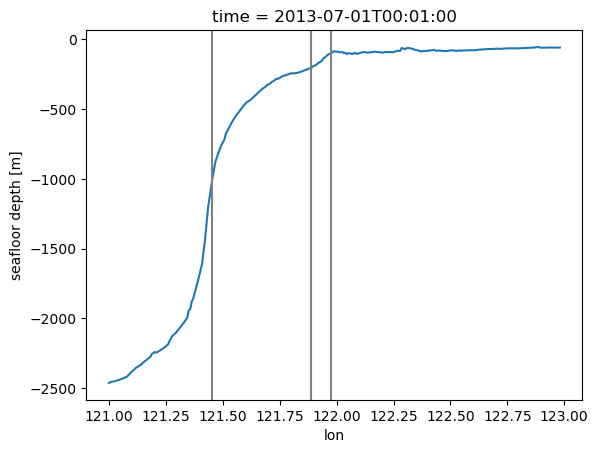

In [6]:
fig, ax = plt.subplots(1,1)
(-tr.dv).isel(time=0).plot(x="lon")
for d, idx in idx_depth_levels.items():
    ax.axvline(tr.lon.isel(s=idx), color="0.5")

---

## mean sea surface temperature

Changing the _FillValue from -999999 to 999999


/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


Text(0.5, 1.0, 'mean sea surface temperature')

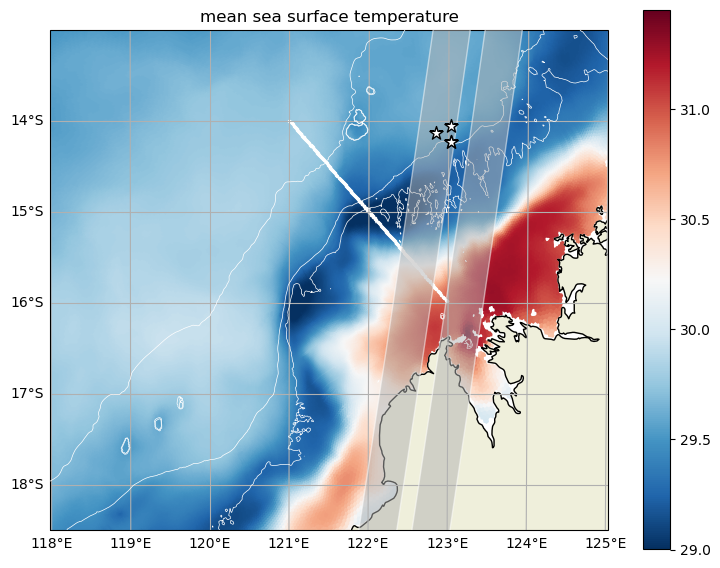

In [7]:
zoom = "cp_large"
zoom = "central"

da = dsm["temp"]

fig, ax = nwa.map_init(zoom, bathy=(grd, dsm), bathy_kw=dict(colors="w"))
nwa.plot_moorings(ax)
_, _, poly, cbar = grd.suntans.plotcelldata(da, cmap="RdBu_r", crs=crs, vmin=29)

ax.scatter(tr.lon.values, tr.lat.values, s=10, c="w", marker=".", transform=crs)

ax.set_title(f"mean sea surface temperature")

Text(0.5, 1.0, 'transect 2, mean sea surface temperature')

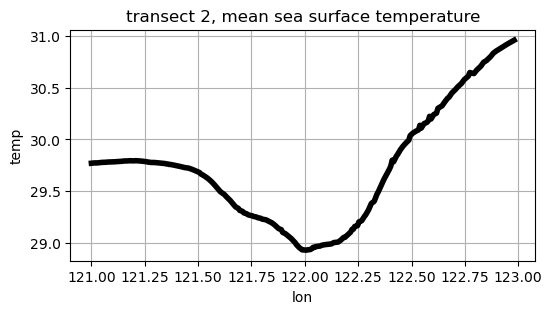

In [11]:
fig, ax = plt.subplots(1,1, figsize=(6,3))

tr["temp"].isel(Nk=0).sel(time=nwa.time_good).mean("time").plot(x="lon", color="k",lw=4)
#tr["temp"].isel(Nk=0).sel(time="2014/").plot(x="lon", color="k",lw=4)

# sanity check: done
#da = dsm["temp"].isel(Nc=idx, Nk=0).assign_coords(lon=grd.xv.isel(Nc=idx))
#da.plot(x="lon")

ax.set_title("[degC]")
ax.grid()
ax.set_title(f"transect {i_tr}, mean sea surface temperature")

Text(0.5, 1.0, 'transect 2, mean sea surface salinity')

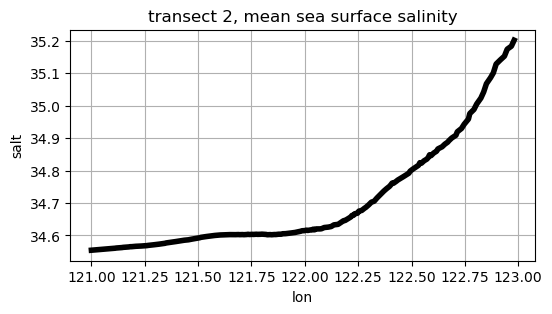

In [14]:
fig, ax = plt.subplots(1,1, figsize=(6,3))

tr["salt"].isel(Nk=0).sel(time=nwa.time_good).mean("time").plot(x="lon", color="k",lw=4)
#tr["temp"].isel(Nk=0).sel(time="2014/").plot(x="lon", color="k",lw=4)

# sanity check: done
#da = dsm["temp"].isel(Nc=idx, Nk=0).assign_coords(lon=grd.xv.isel(Nc=idx))
#da.plot(x="lon")

ax.set_title("[psu]")
ax.grid()
ax.set_title(f"transect {i_tr}, mean sea surface salinity")

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


Text(0.5, 1.0, 'mean sea level')

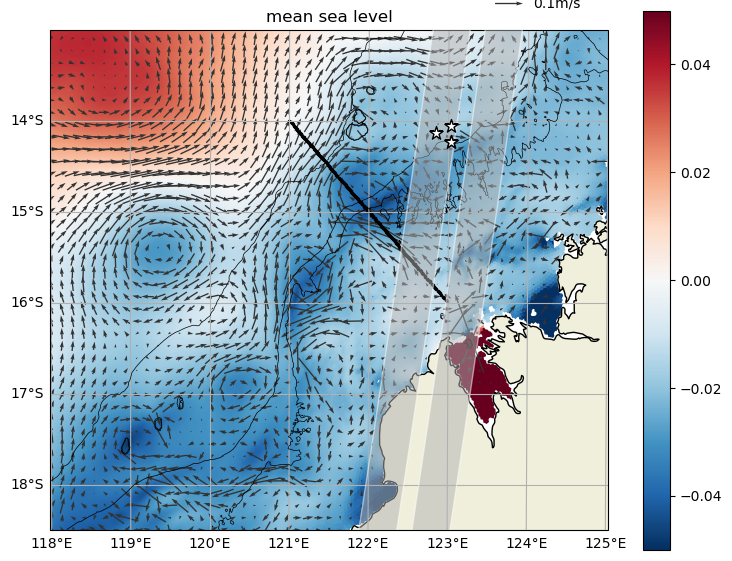

In [15]:
da = dsm["eta"]

idx = nwa.find_point_index(121, -14, grd)
da = da - da.isel(Nc=idx)

fig, ax = nwa.map_init(zoom, bathy=(grd, dsm), bathy_kw=dict(colors="k"))
nwa.plot_moorings(ax)

_, _, poly, cbar = grd.suntans.plotcelldata(da, cmap="RdBu_r", crs=crs, vmin=-.05, vmax=.05)
# "inferno"

vkwargs = dict(di=3, scale=2, uref=.1, xref=.65, yref=.89, color="0.2")
dsuv = nwa.interpolate_hvelocities(dsm, grd, zoom, dx=5e3)
nwa.plot_velocity(ax, dsuv, **vkwargs)

ax.scatter(tr.lon.values, tr.lat.values, s=10, c="k", marker=".", transform=crs)

ax.set_title(f"mean sea level")

Text(0.5, 1.0, 'transect 2, mean sea level')

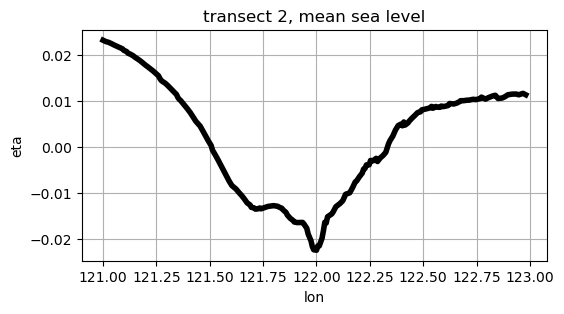

In [16]:
fig, ax = plt.subplots(1,1, figsize=(6,3))

tr["eta"].sel(time=nwa.time_good).mean("time").plot(x="lon", color="k",lw=4)
#tr["temp"].isel(Nk=0).sel(time="2014/").plot(x="lon", color="k",lw=4)

# sanity check: done
#da = dsm["temp"].isel(Nc=idx, Nk=0).assign_coords(lon=grd.xv.isel(Nc=idx))
#da.plot(x="lon")

ax.set_title("[m]")
ax.grid()
ax.set_title(f"transect {i_tr}, mean sea level")

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


Text(0.5, 1.0, 'velocity std')

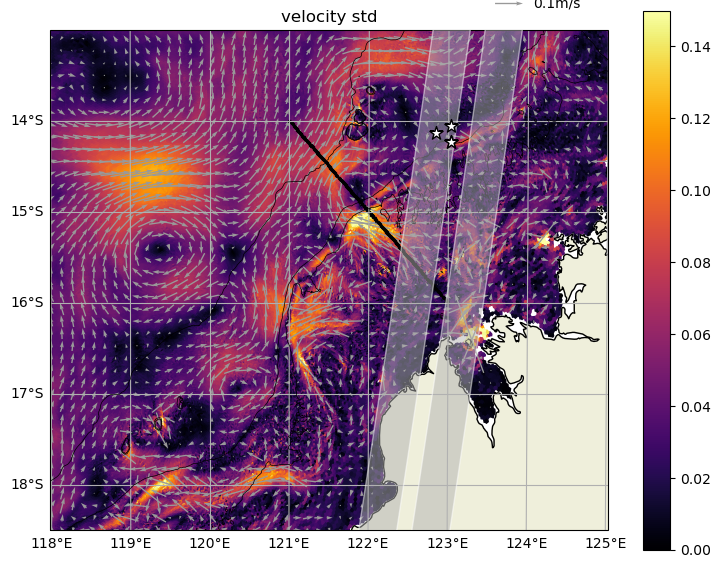

In [17]:
da = np.sqrt(dsm["uc"]**2 + dsm["vc"]**2)

fig, ax = nwa.map_init(zoom, bathy=(grd, dsm), bathy_kw=dict(colors="k"))
nwa.plot_moorings(ax)

_, _, poly, cbar = grd.suntans.plotcelldata(da, cmap="inferno", crs=crs, vmin=0., vmax=.15)

vkwargs = dict(di=3, scale=2, uref=.1, xref=.65, yref=.89, color="0.6")
dsuv = nwa.interpolate_hvelocities(dsm, grd, zoom, dx=5e3)
nwa.plot_velocity(ax, dsuv, **vkwargs)

ax.scatter(tr.lon.values, tr.lat.values, s=10, c="k", marker=".", transform=crs)

ax.set_title(f"velocity std")

In [18]:
# inertial period in hours
Tf = 2*np.pi/pin.geo.coriolis(-15)/3600
print(f"inertial period = {Tf}h")

# 10cm over 50km is via geostrophy a current of: 
u = 9.81*.1/50e3 /pin.geo.coriolis(-15)
print(f"{u:.2f} m/s")

inertial period = -46.237844618143654h
-0.52 m/s


---

## transect perspective

In [27]:
def plot_hoev(depth, time=None, low=True, add_colorbar=True, time_ref=None, eta=0):
    
    if low:
        ds = tr_low
    else:
        ds = tr
        
    i_depth = int(abs(ds.z_r - depth).argmin())
    ds = ds.isel(Nk=i_depth).compute()
    #ds = ds.where(ds.z_r<depth_max, drop=True)
    
    # instantaneous field for tides
    ds_inst = tr

    if time is not None:
        ds = ds.sel(time=time)        
        ds_inst = ds_inst.sel(time=time)
    
    if time_ref is not None:
        if not isinstance(time_ref, list):
            time_ref = [time_ref]
        time_ref = [pd.Timestamp(t) for t in time_ref]
    
    ##
    
    fig, axes = plt.subplots(4, 1, figsize=(10,15), sharex=True)

    ax = axes[0]
    da = ds.temp
    #da = (da - da.isel(s=ds.lon.argmin()))
    #da = (da - da.isel(s=np.abs(ds.lon-122.5).argmin())) # TR3
    da = (da - da.isel(s=np.abs(ds.lon-121.).argmin())) # TR2
    da = da.assign_coords(lon=ds.lon)
    da.plot(ax=ax, x="time", y="lon", cmap="RdBu_r", vmin=-1.5, vmax=2, add_colorbar=add_colorbar)
    # pin.thermal
    #ax.grid()
    ax.set_ylabel("lon [deg]")
    ax.set_xlabel("")
    ax.set_title("")
    ax.invert_yaxis()
    _add_depth_levels(ax)
    if time_ref is not None:
        for t in time_ref:
            ax.axvline(t, color="0.7")

        
    ax = axes[1]
    ds.u.plot(ax=ax, x="time", y="lon", vmax=0.5, add_colorbar=add_colorbar)
    #ax.grid()
    ax.set_ylabel("lon [deg]")
    ax.set_xlabel("")
    ax.set_title("")
    ax.invert_yaxis()
    _add_depth_levels(ax)
    if time_ref is not None:
        for t in time_ref:
            ax.axvline(t, color="0.7")

    ax = axes[2]
    ds.v.plot(ax=ax, x="time", y="lon", vmax=0.5, add_colorbar=add_colorbar)
    #ax.grid()
    ax.set_ylabel("lon [deg]")
    ax.set_xlabel("")
    ax.set_title("")
    ax.invert_yaxis()
    _add_depth_levels(ax)
    if time_ref is not None:
        for t in time_ref:
            ax.axvline(t, color="0.7")

    #ax = axes[3]
    #ds["surface_vorticity"].plot(ax=ax, x="time", y="lon", vmax=2, add_colorbar=add_colorbar)
    #ax.grid()
    #ax.set_ylabel("lon [deg]")
    #ax.set_xlabel("")
    #ax.set_title("")    

    ax = axes[3]
    if eta==0:
        ds_inst["eta"].isel(s=0).plot(ax=ax)
        #ax.grid()
        ax.set_ylabel("sea level [m]")
        ax.set_xlabel("time")
        ax.set_title("")
    else:
        da = ds.eta
        #da = (da - da.isel(s=ds.lon.argmin()))
        #da = (da - da.isel(s=np.abs(ds.lon-122.5).argmin())) # TR3
        da = (da - da.isel(s=np.abs(ds.lon-121.).argmin())) # TR2
        da = da.assign_coords(lon=ds.lon)
        da.plot(ax=ax, x="time", y="lon", cmap="RdBu_r", vmin=-.1, vmax=.1, add_colorbar=add_colorbar)
        # pin.thermal
        #ax.grid()
        ax.set_ylabel("lon [deg]")
        ax.set_xlabel("time")
        ax.set_title("")
        ax.invert_yaxis()
        _add_depth_levels(ax)
        if time_ref is not None:
            for t in time_ref:
                ax.axvline(t, color="0.7")
    
    
def _add_depth_levels(ax):
    for d, idx in idx_depth_levels.items():
        ax.axhline(tr.lon.isel(s=idx), color="0.7")    

In [28]:
t0 = "2014/02/21 13:00:00"
t0_onset = "2014/02/15 00:00:00"

t1 = "2014/03/05 00:00:00"

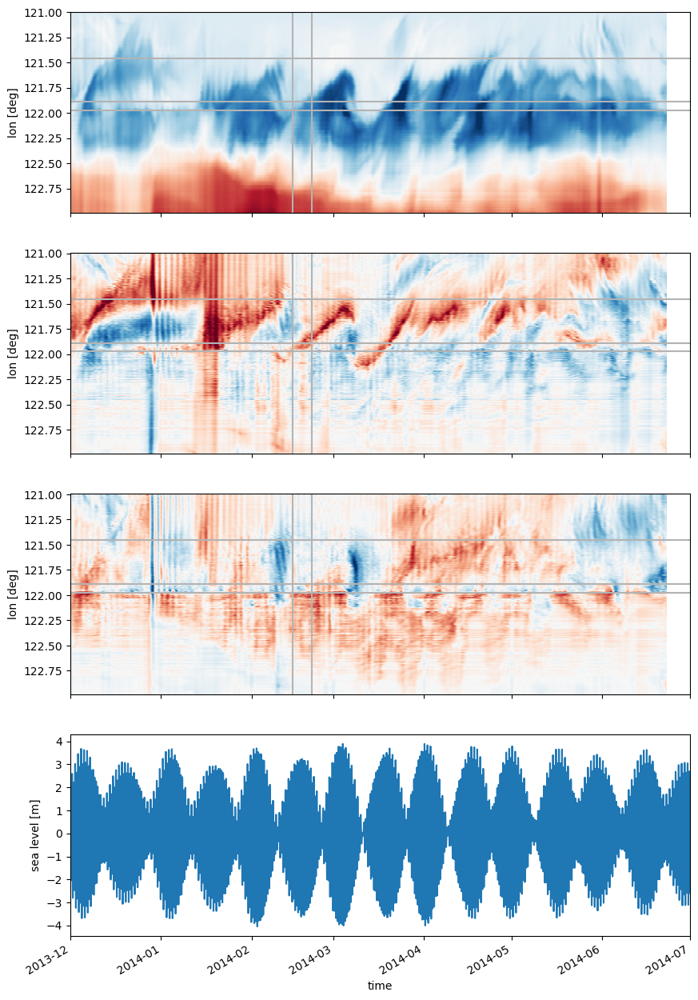

In [29]:
#plot_hoev(0, time=nwa.time_good, low=True, add_colorbar=False, time_ref=t0)
plot_hoev(0, time=nwa.time_good, low=True, add_colorbar=False, time_ref=[t0, t0_onset])

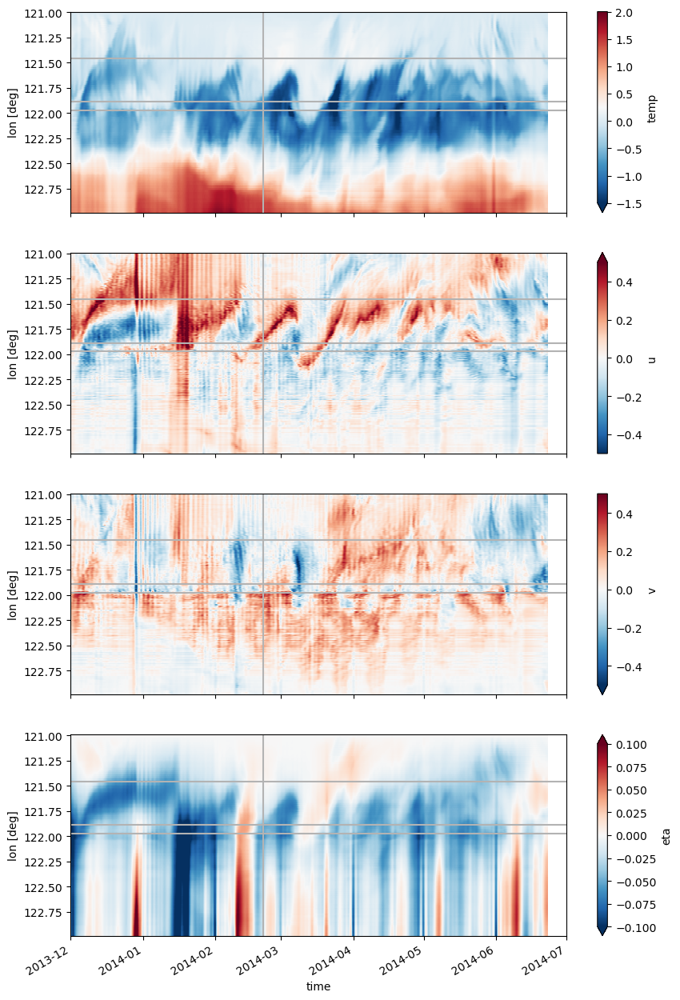

In [17]:
plot_hoev(0, time=nwa.time_good, low=True, add_colorbar=True, time_ref=t0, eta=1)

### plot vertical slices

In [30]:
def plot_transect(t, low=True, depth_max = 400):

    if low:
        ds = tr_low
    else:
        ds = tr    
    
    ds = ds.sel(time=t).compute() # 0 instantaneous, 1 low frequency
    ds = ds.where(ds.z_r<depth_max, drop=True)

    fig, axes = plt.subplots(3,1, figsize=(10,8), sharex=True, sharey=True)

    ax = axes[0]
    ds.u.plot(ax=ax, x="lon", y="z_r")
    ax.grid()
    ax.set_ylabel("depth [m]")
    ax.set_xlabel("")
    ax.set_title(t)

    ax = axes[1]
    ds.v.plot(ax=ax, x="lon", y="z_r")
    ax.grid()
    ax.set_ylabel("depth [m]")
    ax.set_xlabel("")
    ax.set_title("")

    ax = axes[2]
    ds.temp.plot.contourf(ax=ax, x="lon", y="z_r", levels=30)
    ax.set_ylabel("depth [m]")
    ax.grid()
    ax.set_title("")

    ax.set_ylim(0, depth_max)
    ax.invert_yaxis()


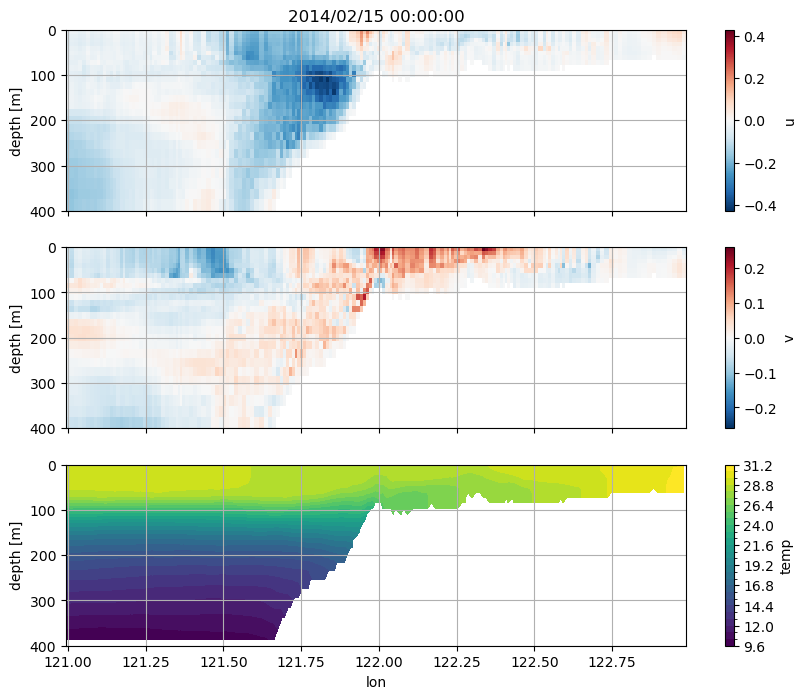

In [31]:
plot_transect(t0_onset, low=True, depth_max = 400)

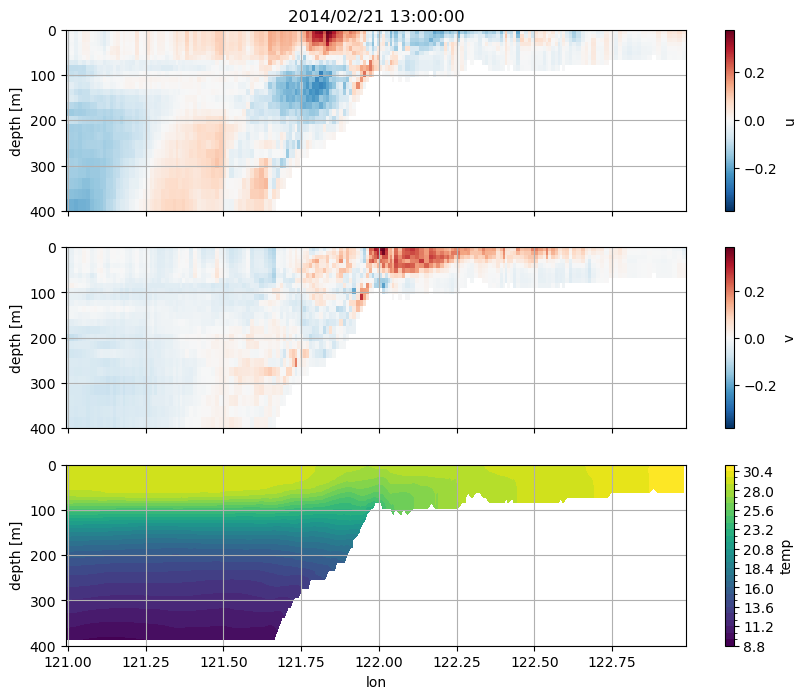

In [13]:
plot_transect(t0, low=True, depth_max = 400)

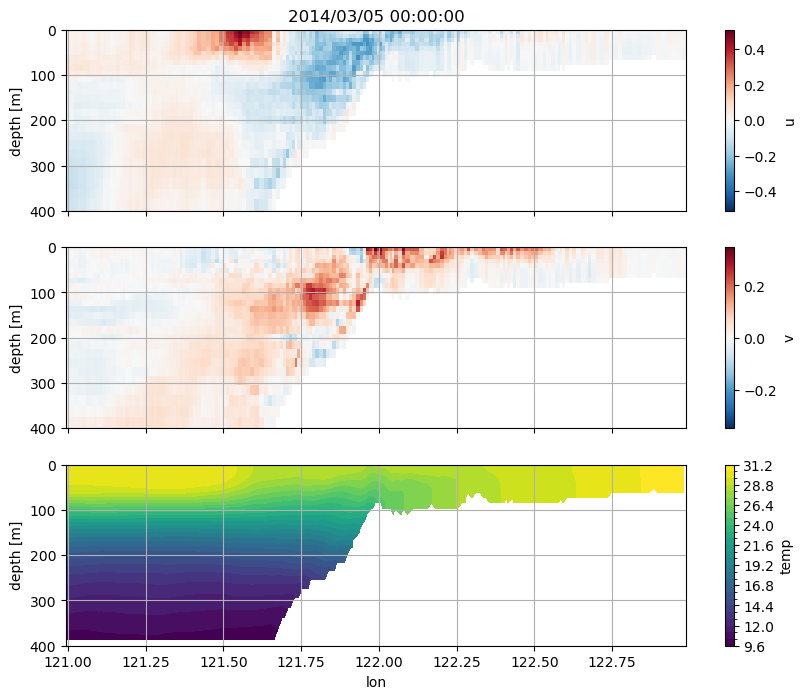

In [43]:
plot_transect(t1, low=True, depth_max = 400)

In [45]:
def plot_profiles(t, lon, low=True, depth_max = 400):

    if low:
        ds = tr_low
    else:
        ds = tr
    
    ilon = [int(np.abs(tr.lon-l).argmin("s")) for l in lon]
    
    ds = ds.sel(time=t).compute() # 0 instantaneous, 1 low frequency
    ds = ds.where(ds.z_r<depth_max, drop=True)

    fig, axes = plt.subplots(1,3, figsize=(10,5), sharey=True)

    ax = axes[0]
    for i, _lon in zip(ilon, lon):
        ds.isel(s=i).temp.plot(ax=ax, y="z_r", label=str(_lon))
    ax.set_ylabel("depth [m]")
    ax.grid()
    ax.set_ylim(0, depth_max)
    ax.invert_yaxis()
    ax.legend()
    ax.set_title("temperature")
    ax.set_xlabel("[degC]")

    ax = axes[1]
    for i, _lon in zip(ilon, lon):
        ds.isel(s=i).salt.plot(ax=ax, y="z_r", label=str(_lon))
    ax.set_ylabel("")
    ax.grid()
    ax.set_ylim(0, depth_max)
    ax.invert_yaxis()
    ax.set_title("salinity")
    ax.set_xlabel("[psu]")
    
    ax = axes[2]
    for i, _lon in zip(ilon, lon):
        ds.isel(s=i).rho.plot(ax=ax, y="z_r", label=str(_lon))
    ax.set_ylabel("")
    ax.grid()
    ax.set_ylim(0, depth_max)
    ax.invert_yaxis()
    ax.set_title("rho")
    ax.set_xlabel("[kg/m3]")

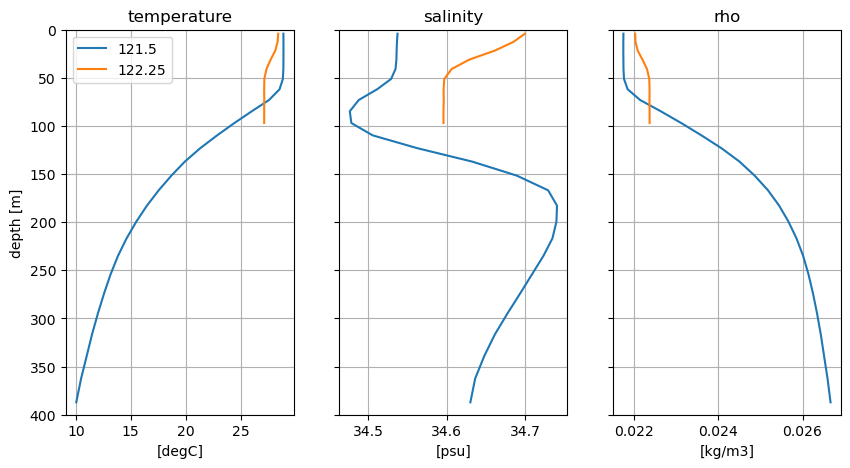

In [46]:
plot_profiles(t0_onset, [121.5, 122.25])

### maps

In [49]:
def plot_map_snapshot(v, t):

    ds, ds_low = load_data(t)
    
    zoom = "cp_large"

    if v=="vorticity":
        da = ds_low.vorticity
        kwargs = dict(vmin=-2, vmax=2, cmap="RdBu_r")
    elif v=="temp":
        da = ds_low.temp
        kwargs = dict(cmap="RdBu_r") #vmin=-2, vmax=2, 
    elif v=="temp_anomaly":
        idx = nwa.find_point_index(121, -14, grd)
        da = ds.temp - ds.temp.isel(Nc=idx)
        kwargs = dict(cmap="RdBu_r", vmin=-2, vmax=2)
    elif v=="eta":
        da = ds_low.eta
        kwargs = dict(cmap="RdBu_r") #vmin=-2, vmax=2, 
    elif v=="eta_anomaly":
        idx = nwa.find_point_index(121, -14, grd)
        da = ds_low.eta - ds_low.eta.isel(Nc=idx)
        kwargs = dict(cmap="RdBu_r", vmin=-.1, vmax=.1) #

    vkwargs = dict(dx=2e3, di=4)
    dsuv = nwa.interpolate_hvelocities(ds_low, grd, zoom, dx=vkwargs["dx"])

    fig, ax = nwa.map_init(zoom, bathy=(grd, ds_low), bathy_kw=dict(colors="k"))
    nwa.plot_moorings(ax, moorings=moorings)
    _, _, poly, cbar = grd.suntans.plotcelldata(da, **kwargs, crs=crs)

    nwa.plot_velocity(ax, dsuv, di=vkwargs["di"], uref=.2, xref=.7, yref=.88)

    ax.scatter(tr.lon.values, tr.lat.values, s=10, c="k", marker=".", transform=crs)

    t = str(da.time.dt.strftime('%Y/%m/%d %Hh').values)
    ax.set_title(t)

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


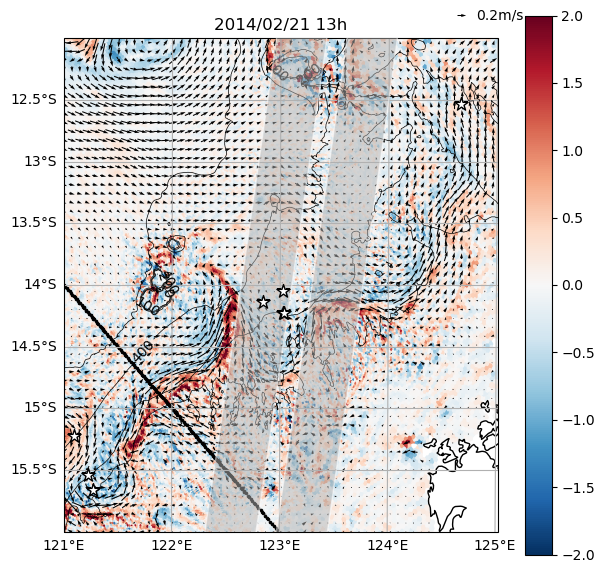

In [26]:
plot_map_snapshot("vorticity", t0)

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


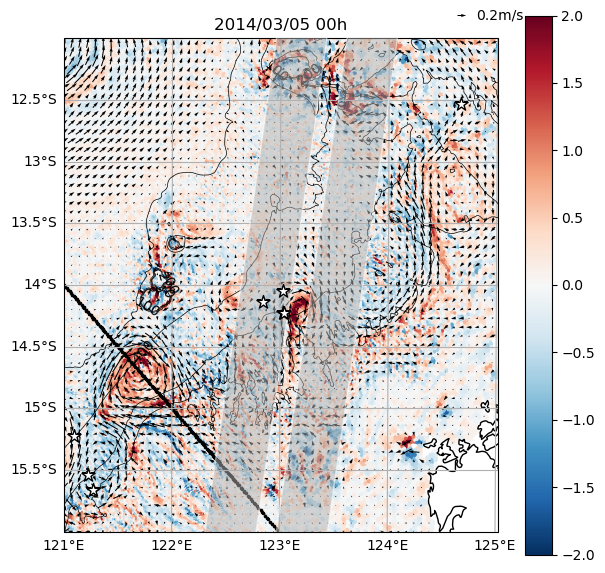

In [31]:
plot_map_snapshot("vorticity", t1)

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


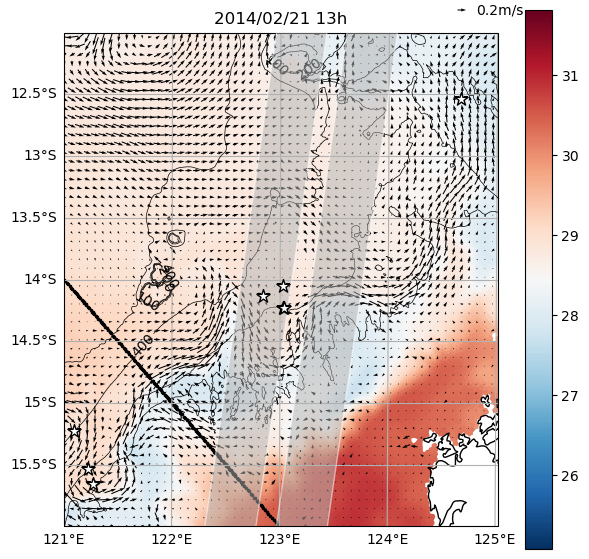

In [28]:
plot_map_snapshot("temp", t0)

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


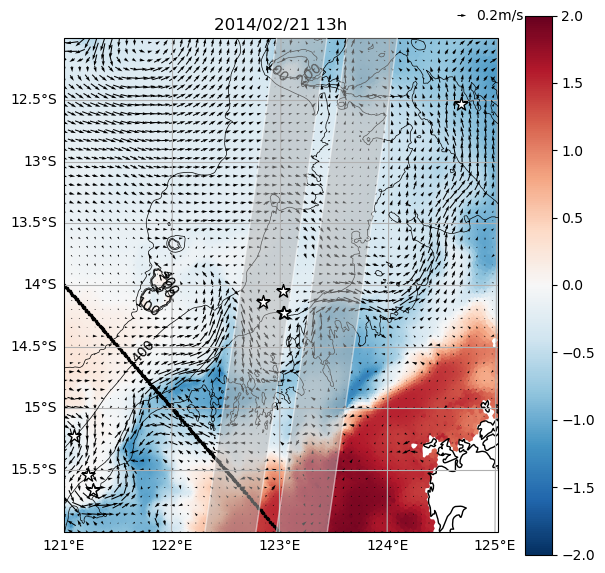

In [38]:
plot_map_snapshot("temp_anomaly", t0)

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


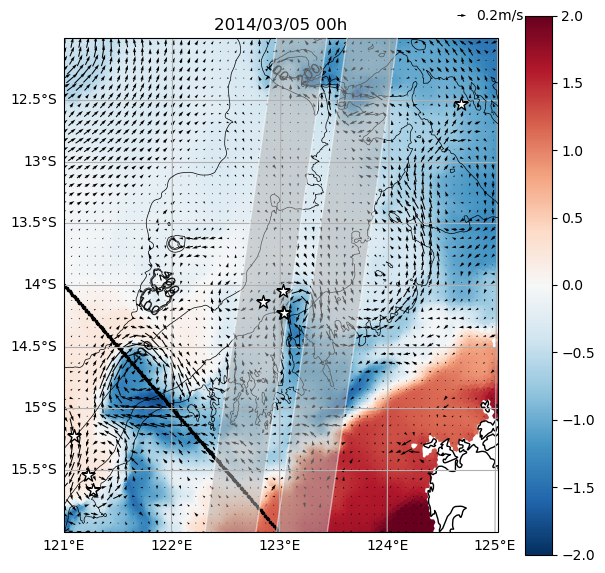

In [42]:
plot_map_snapshot("temp_anomaly", t1)

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


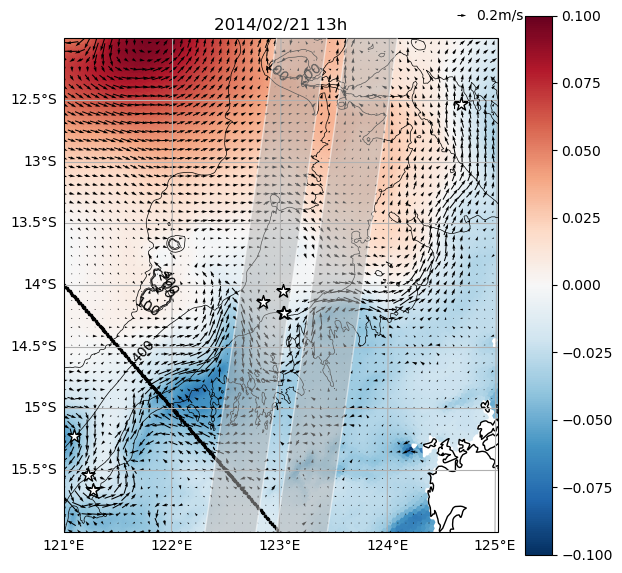

In [50]:
plot_map_snapshot("eta_anomaly", t0)

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


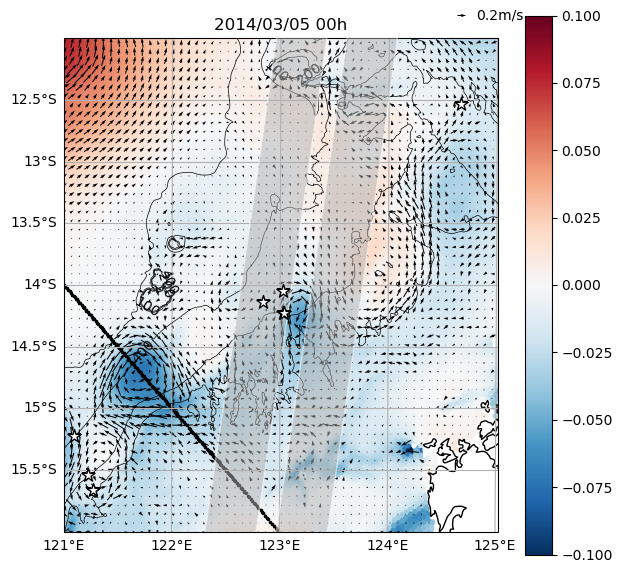

In [51]:
plot_map_snapshot("eta_anomaly", t1)

---

In [26]:
cluster.close()